# **Imports**

Below are all the **Imports** used in the **Notebook**.

In [12]:
# Common
import os 
import keras 
import numpy as np
import pandas as pd
import tensorflow as tf

# Data Loading
from keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt

# Model 
import tensorflow_hub as hub
from keras.models import Sequential, load_model
from keras.layers import Dense

# Callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Optimizer
from tensorflow.keras.optimizers import Adam

# **Data Info**

Before loading the data, let's gather some information about the **Data Distribution**.

In [2]:
# Specify Root Paths
train_path = '../Kaggle500Dataset/train'
valid_path = '../Kaggle500Dataset/valid'
test_path  = '../Kaggle500Dataset/test'

In [4]:
# Get Class Names
class_names = sorted(os.listdir(train_path))
# class_names.remove('.DS_Store')
n_classes = len(class_names)
print(f"Number of Classes : {n_classes}.\nClasss : \n{class_names}")

Number of Classes : 510.
Classs : 
['ABBOTTS BABBLER', 'ABBOTTS BOOBY', 'ABYSSINIAN GROUND HORNBILL', 'AFRICAN CROWNED CRANE', 'AFRICAN EMERALD CUCKOO', 'AFRICAN FIREFINCH', 'AFRICAN OYSTER CATCHER', 'AFRICAN PIED HORNBILL', 'AFRICAN PYGMY GOOSE', 'ALBATROSS', 'ALBERTS TOWHEE', 'ALEXANDRINE PARAKEET', 'ALPINE CHOUGH', 'ALTAMIRA YELLOWTHROAT', 'AMERICAN AVOCET', 'AMERICAN BITTERN', 'AMERICAN COOT', 'AMERICAN FLAMINGO', 'AMERICAN GOLDFINCH', 'AMERICAN KESTREL', 'AMERICAN PIPIT', 'AMERICAN REDSTART', 'AMERICAN ROBIN', 'AMERICAN WIGEON', 'AMETHYST WOODSTAR', 'ANDEAN GOOSE', 'ANDEAN LAPWING', 'ANDEAN SISKIN', 'ANHINGA', 'ANIANIAU', 'ANNAS HUMMINGBIRD', 'ANTBIRD', 'ANTILLEAN EUPHONIA', 'APAPANE', 'APOSTLEBIRD', 'ARARIPE MANAKIN', 'ASHY STORM PETREL', 'ASHY THRUSHBIRD', 'ASIAN CRESTED IBIS', 'ASIAN DOLLARD BIRD', 'ASIAN GREEN BEE EATER', 'AUCKLAND SHAQ', 'AUSTRAL CANASTERO', 'AUSTRALASIAN FIGBIRD', 'AVADAVAT', 'AZARAS SPINETAIL', 'AZURE BREASTED PITTA', 'AZURE JAY', 'AZURE TANAGER', 'AZURE TI

We have **510 Classes**, now the **Class Distribution** will decide which **model to use**.

In [5]:
# Calculate Class Distribution
class_dis = [len(os.listdir(train_path + f"/{name}")) for name in class_names]

In [6]:
# Plot Class Distribution
fig = px.bar(y=class_names, x=class_dis, title="Training Class Distribution", height=1500, color=class_names)
fig.update_layout({'title':{'x':0.5}})
fig.show()

In [7]:
average_n_images_per_class = int(np.mean(class_dis))
print(f"Average Number of Images Per Class : {average_n_images_per_class}")

Average Number of Images Per Class : 160


# As we can see that all the **classes are not equally distributed** but **on an average** the **class distribution** is the **same**. The number of images assigned to each **class is very low** (on average **160**) due to which it can be tough for the model to **learn the data effectively**. Let's try this out.

In [8]:
# Calculate Class Distribution
class_dis = [len(os.listdir(valid_path + f"/{name}")) for name in class_names]

# Plot Class Distribution
fig = px.bar(y=class_names, x=class_dis, title="Validation Class Distribution", height=1500, color=class_names)
fig.update_layout({'title':{'x':0.5}})
fig.show()

The **good news** is all the classes have **equal number of images**, the **bad news** is **all classes** only have **5 Images**. In my eyes, only **5 images per class** are **not sufficient** to **understand the model's understanding** of that **particular class**. 

In [9]:
# Calculate Class Distribution
class_dis = [len(os.listdir(test_path + f"/{name}")) for name in class_names]

# Plot Class Distribution
fig = px.bar(y=class_names, x=class_dis, title="Testing Class Distribution", height=1500, color=class_names)
fig.update_layout({'title':{'x':0.5}})
fig.show()

It is exactly same as the **Validation Data Distribution**.

# **Data Loading**

So we are not aware of the **Data/Class Distribution**, it's time to load the **data and apply some preprocessing**.

In [10]:
def define_paths(dir):
    filepaths = []
    labels = []
    folds = os.listdir(dir)
    for fold in folds:
        foldpath = os.path.join(dir, fold)
        if not os.path.isdir(foldpath):
            continue
        filelist = os.listdir(foldpath)
        for file in filelist:
            fpath = os.path.join(foldpath, file)

            filepaths.append(fpath)
            labels.append(fold)
    return filepaths, labels

def define_df(files, classes):
    Fseries = pd.Series(files, name= 'filepaths')
    Lseries = pd.Series(classes, name='labels')
    return pd.concat([Fseries, Lseries], axis= 1)

def create_df(tr_dir, val_dir, ts_dir):
    # train dataframe
    files, classes = define_paths(tr_dir)
    train_df = define_df(files, classes)
    # valid dataframe
    files, classes = define_paths(val_dir)
    valid_df = define_df(files, classes)
    # test dataframe
    files, classes = define_paths(ts_dir)
    test_df = define_df(files, classes)
    return train_df, valid_df, test_df

In [13]:
# Get Dataframes
train_dir = '../Kaggle500Dataset/train'
valid_dir = '../Kaggle500Dataset/valid'
test_dir = '../Kaggle500Dataset/test'
train_df, valid_df, test_df = create_df(train_dir, valid_dir, test_dir)

In [14]:
def create_gens(train_df, valid_df, test_df, batch_size):
    img_size = (224, 224)
    channels = 3
    img_shape = (img_size[0], img_size[1], channels)
    ts_length = len(test_df)
#     test_batch_size = batch_size
    test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
    test_steps = ts_length // test_batch_size
    def scalar(img):
        return img
    tr_gen = ImageDataGenerator(preprocessing_function= scalar, horizontal_flip= True)
    ts_gen = ImageDataGenerator(preprocessing_function= scalar)
    train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= 'rgb', shuffle= True, batch_size= batch_size)
    valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= 'rgb', shuffle= True, batch_size= batch_size)
    test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= 'rgb', shuffle= False, batch_size= test_batch_size)
    return train_gen, valid_gen, test_gen

In [16]:
# Get Generators
batch_size = 128
train_gen, valid_gen, test_gen = create_gens(train_df, valid_df, test_df, batch_size)


Found 81950 validated image filenames belonging to 510 classes.
Found 2550 validated image filenames belonging to 510 classes.
Found 2550 validated image filenames belonging to 510 classes.


# **Data Visualization**

In [17]:
def show_images(gen):
    g_dict = gen.class_indices
    classes = list(g_dict.keys())
    images, labels = next(gen)
    plt.figure(figsize= (20, 20))
    length = len(labels)
    sample = min(length, 25)
    for i in range(sample):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, color= 'blue', fontsize= 12)
        plt.axis('off')
    plt.show()

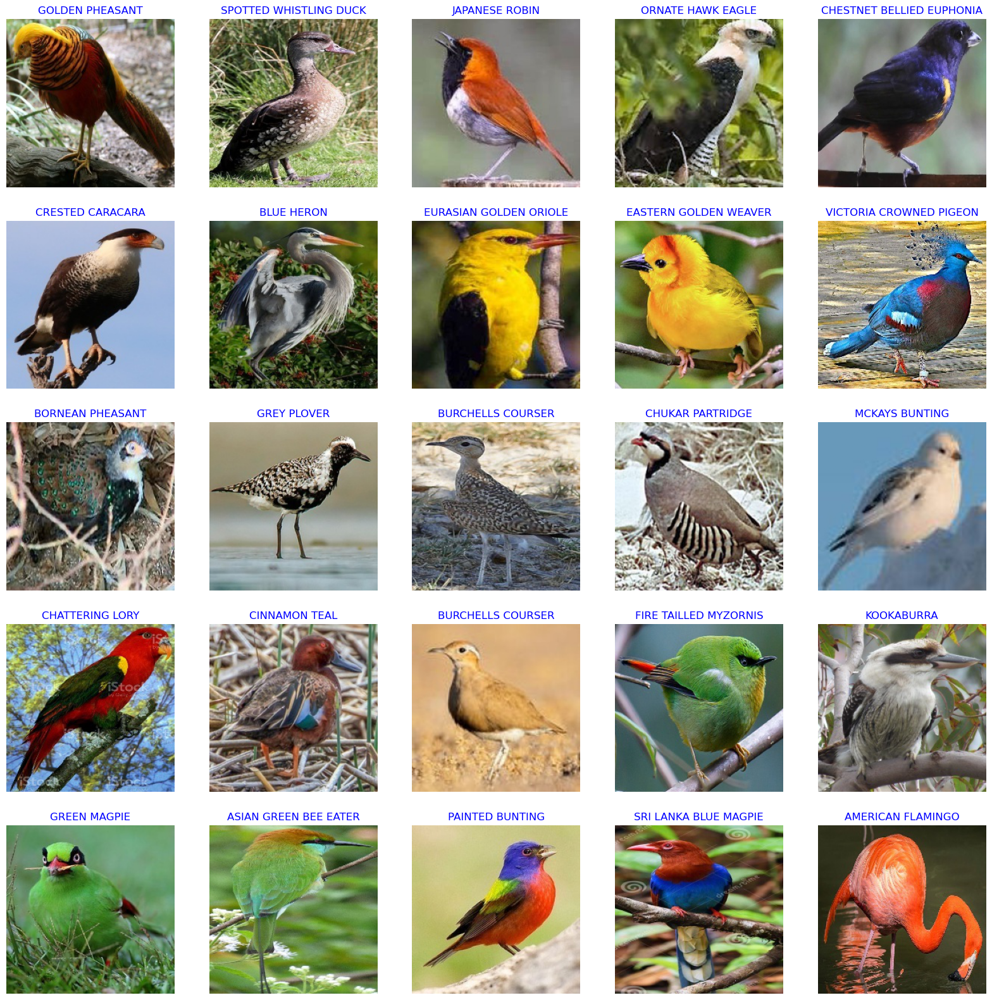

In [18]:

show_images(train_gen)

# **BiT - Big Transfer**

**Keeping in mind the diversity of the data**, I guess **BiT** will be able to achieve **better performance in less time**.

## **Load BiT**

In [29]:
model_url = "https://tfhub.dev/google/bit/m-r50x1/1"
bit = hub.KerasLayer(model_url)

## **Create Model**

In [30]:
model_name = "BiT-Bird-Species"
model = Sequential([bit, Dense(n_classes, activation='softmax', kernel_initializer='zeros')], name=model_name)

# **Compile Model**

In [15]:
lr = 0.05
print(f"LR : {lr}")

LR : 0.05


In [16]:
SCHEDULE_BOUNDARIES = [
    200,
    300,
    400,
]  # more the dataset size the schedule length increase

lr_schedule = tf.keras.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=SCHEDULE_BOUNDARIES,
    values=[
        lr,
        lr * 0.1,
        lr * 0.01,
        lr * 0.001,
    ],
)
opt = tf.keras.optimizers.SGD(learning_rate=lr_schedule, momentum=0.9)

In [17]:
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=opt,
    metrics=['accuracy']
)

## **Callbacks**

In [18]:
cbs = [EarlyStopping(patience=2, restore_best_weights=True), ModelCheckpoint("./big_transfer/"+model_name+".h5", save_best_only=True)]

## **Train Model**

In [19]:
history = model.fit(x=train_ds,
         validation_data=valid_ds,
         epochs=10,
         callbacks=cbs)

2023-01-01 16:47:47.896326: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Epoch 1/10
552/552 [==============================] - 2382s 4s/step - loss: 8.7038 - accuracy: 0.8007 - val_loss: 1.3370 - val_accuracy: 0.9560
Epoch 2/10
552/552 [==============================] - 2375s 4s/step - loss: 1.5639 - accuracy: 0.9370 - val_loss: 1.2986 - val_accuracy: 0.9564
Epoch 3/10
552/552 [==============================] - 2379s 4s/step - loss: 1.5380 - accuracy: 0.9377 - val_loss: 1.2676 - val_accuracy: 0.9560
Epoch 4/10
552/552 [==============================] - 2380s 4s/step - loss: 1.4933 - accuracy: 0.9391 - val_loss: 1.2401 - val_accuracy: 0.9560
Epoch 5/10
552/552 [==============================] - 2401s 4s/step - loss: 1.4551 - accuracy: 0.9401 - val_loss: 1.2158 - val_accuracy: 0.9560
Epoch 6/10
552/552 [==============================] - 2383s 4s/step - loss: 1.4444 - accuracy: 0.9408 - val_loss: 1.1916 - val_accuracy: 0.9560
Epoch 7/10
552/552 [==============================] - 2386s 4s/step - loss: 1.4022 - accuracy: 0.9415 - val_loss: 1.1699 - val_accuracy:

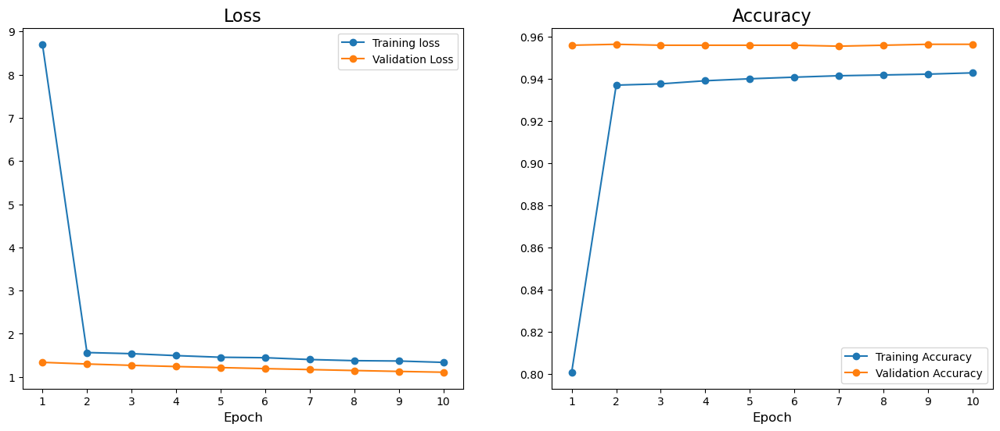

In [27]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,6))
title_fontsize = 16
axis_fontsize = 12

total_epochs = 10

ax1.plot(range(1, total_epochs + 1), history.history['loss'], marker='o', label='Training loss')
ax1.plot(range(1, total_epochs + 1), history.history['val_loss'], marker='o', label='Validation Loss')
ax1.legend()
ax1.set_xticks(range(1, total_epochs + 1))
ax1.set_title('Loss', fontsize=title_fontsize)
ax1.set_xlabel('Epoch', fontsize=axis_fontsize)

ax2.plot(range(1, total_epochs + 1), history.history['accuracy'], marker='o', label='Training Accuracy')
ax2.plot(range(1, total_epochs + 1), history.history['val_accuracy'], marker='o', label='Validation Accuracy')
ax2.legend()
ax2.set_xticks(range(1, total_epochs + 1))
ax2.set_title('Accuracy', fontsize=title_fontsize)
ax2.set_xlabel('Epoch', fontsize=axis_fontsize);

In [32]:
trained_model = load_model('./big_transfer/BiT-Bird-Species.h5', custom_objects={"KerasLayer":bit})

# **Model Evaluation**

In [33]:
trained_model.evaluate(test_ds)

18/18 [==============================] - 74s 4s/step - loss: 0.5028 - accuracy: 0.9733


[0.5027885437011719, 0.9733333587646484]

# **Model Prediction**

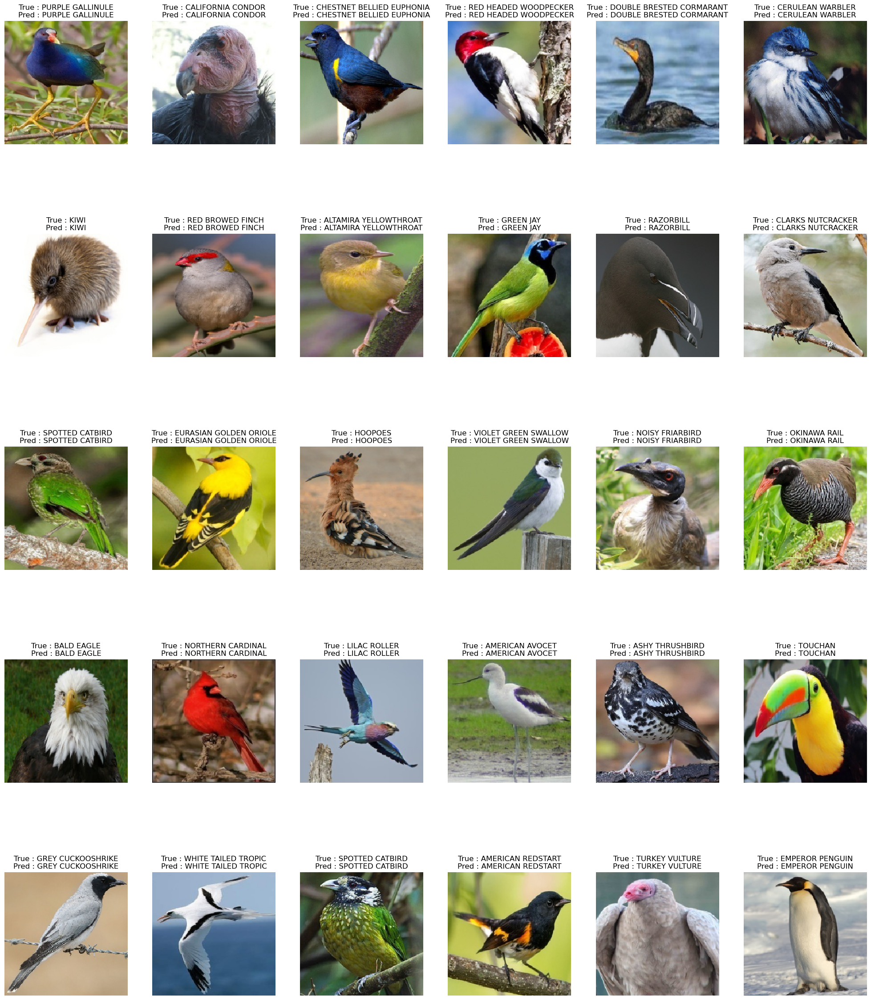

In [34]:
show_images(data=test_ds, model=trained_model)

The model is trained for **10 epochs** and achieved a **robust performance.** 
* **94% Training Accuracy** 
* **Validation Accuracy of 95%(approx)** 
* **Testing accuracy of 97%(approx)**.